# Advance Lane Finding

In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
%matplotlib inline

# Camera Calibration

This section is about calibrating the camera.  Images produced by cameras with lenses have distortion due to the face that the lens is not perfect and the senors used to collect the light is finitie in size.  Using images of a regular square patterns like a checker board allow for the measurement of the distortion.   Once this distortion is measured, images can to transformed to reverse the distortion.

Below is the code and resulting images for the calibartion of the camera used in this project.

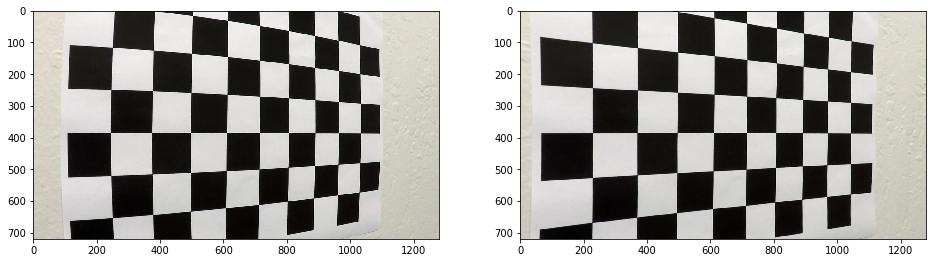

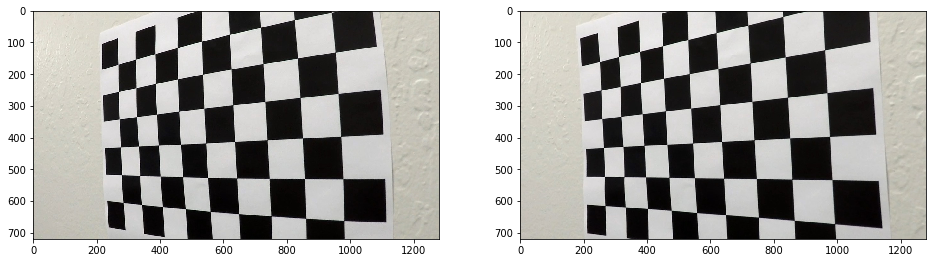

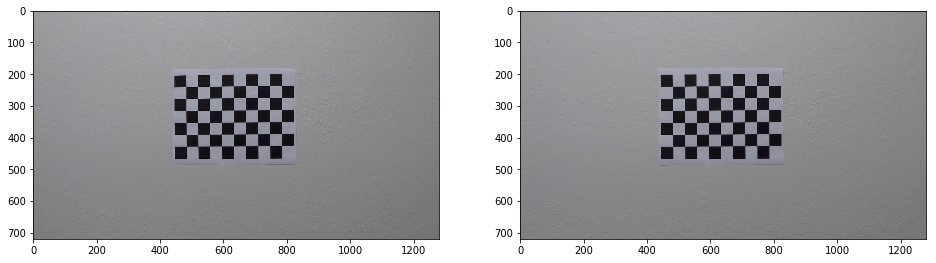

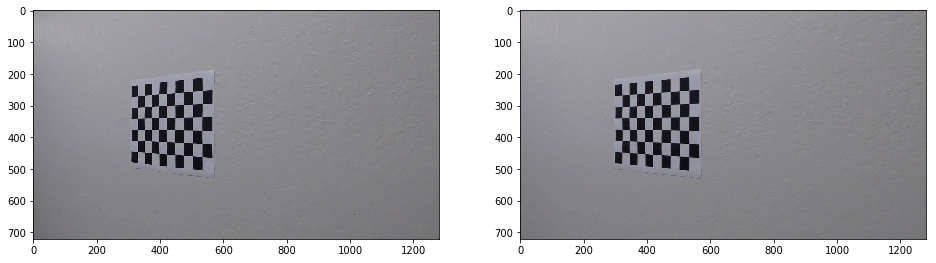

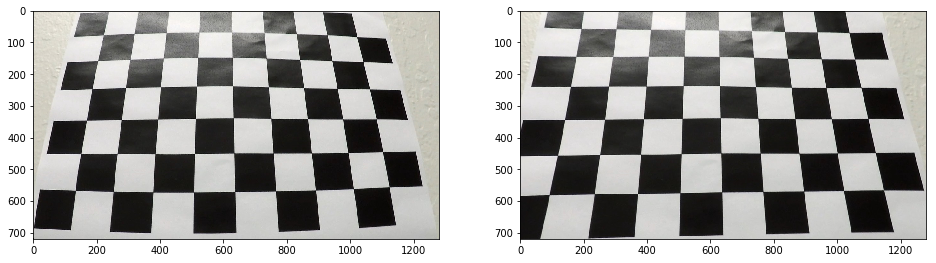

...

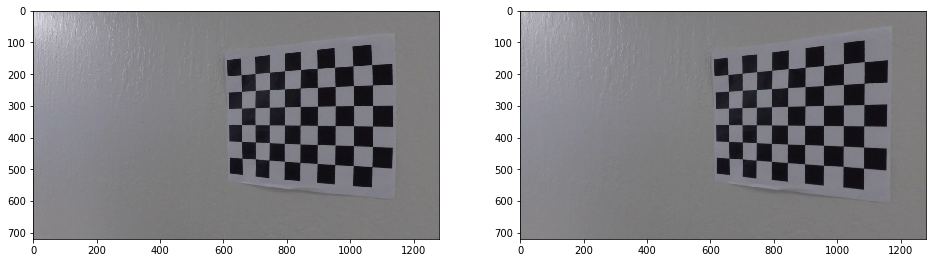

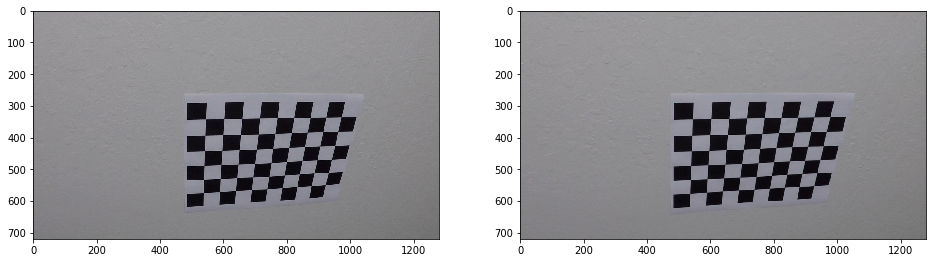

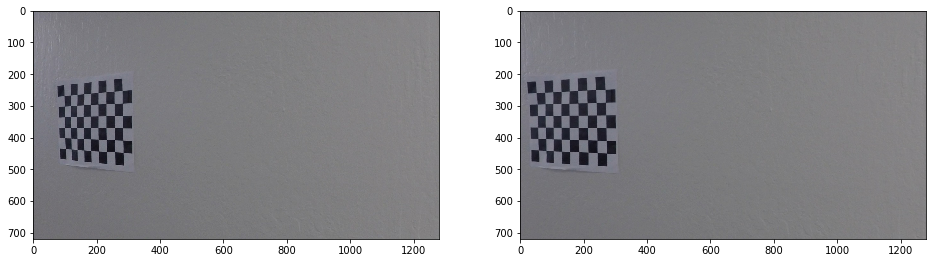

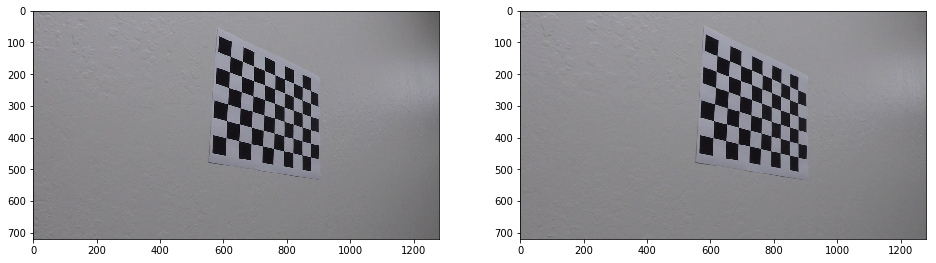

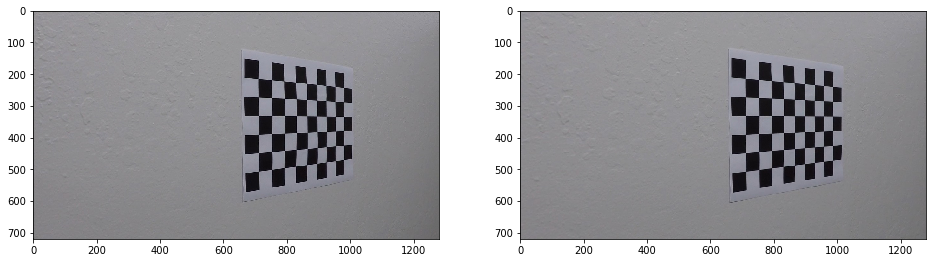

In [2]:
from glob import glob

nx = 9
ny = 6

objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:ny, 0:nx].T.reshape(-1,2)

imgpoints, objpoints = [], []

calibration_imgs = []
for img_loc in glob('camera_cal/calibration*.jpg'):
    calibration_imgs.append(cv2.cvtColor(cv2.imread(img_loc), cv2.COLOR_BGR2RGB))
    gray = cv2.cvtColor(cv2.imread(img_loc), cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (ny, nx),None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, calibration_imgs[0].shape[:2][::-1],None,None)

for img in calibration_imgs:
    plt.figure(figsize=(16,8))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax = plt.subplot(1,2,1)
    plt.imshow(img)
    ax = plt.subplot(1,2,2)
    plt.imshow(dst)
    plt.show()

# Lane Detection - Preprocessing

Each image needs to be preprocessed for lane detection.  We want to perform transformations on the image inorder to highlight the lanes.  I did this though a combination on trying to file yellow and white portions of the image, and also looking for regions where the x-derivative is large.

## 1. Undistort Image

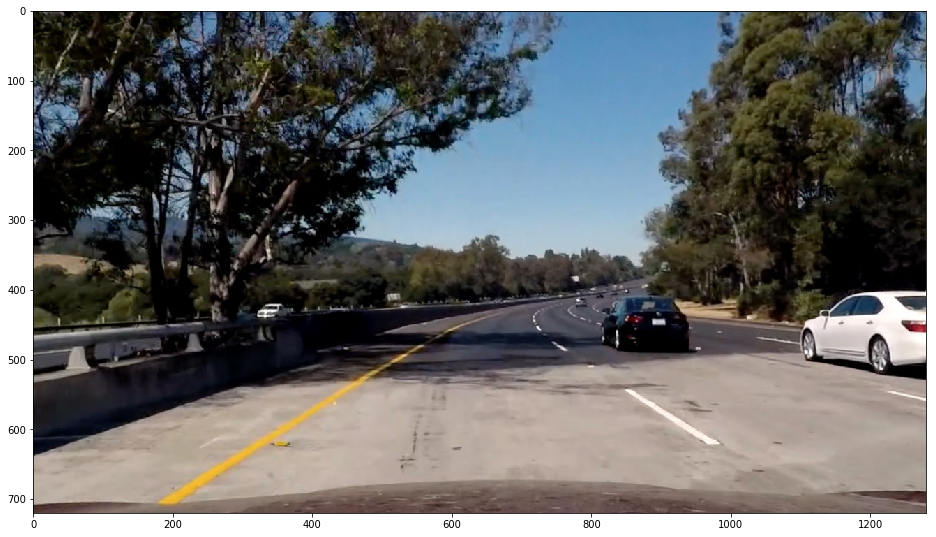

In [3]:
def undistort_image(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

raw = cv2.cvtColor(cv2.imread('test_images/test5.jpg'), cv2.COLOR_BGR2RGB)
img = undistort_image(raw)

plt.figure(figsize=(16,16))
plt.imshow(img)
plt.show()

## 2. Select our bright and yellow areas

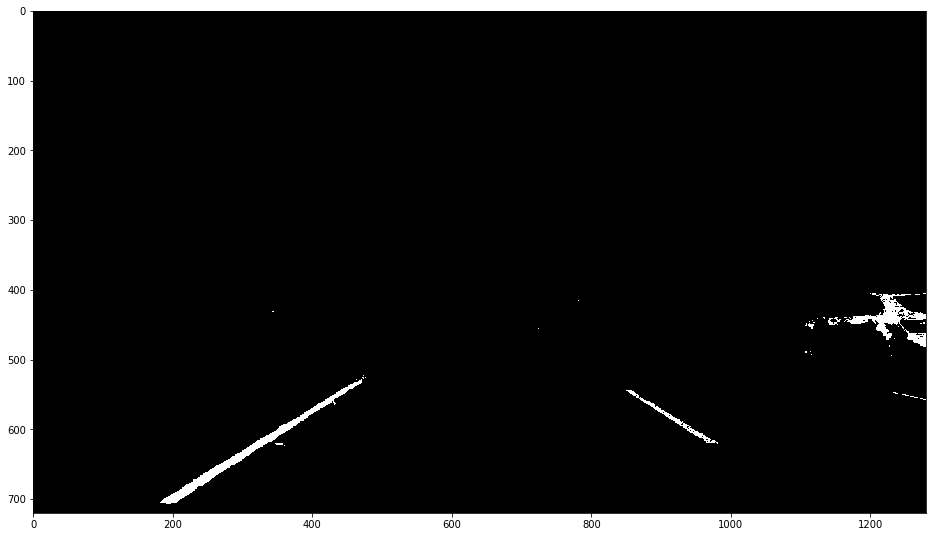

In [4]:
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    mask = (s_channel > thresh[0]) & (s_channel <= thresh[1]) 
    mask = mask & (
        ((h_channel > 15) & (h_channel < 25) & (l_channel > 75)) |
        (l_channel > 150)
    )
    binary_output = np.zeros_like(s_channel)
    binary_output[mask] = 1
    return binary_output

plt.figure(figsize=(16,16))
plt.imshow(hls_select(img, thresh=(150, 255)),cmap='gray')
plt.show()

## 3. Select our large x-gradients

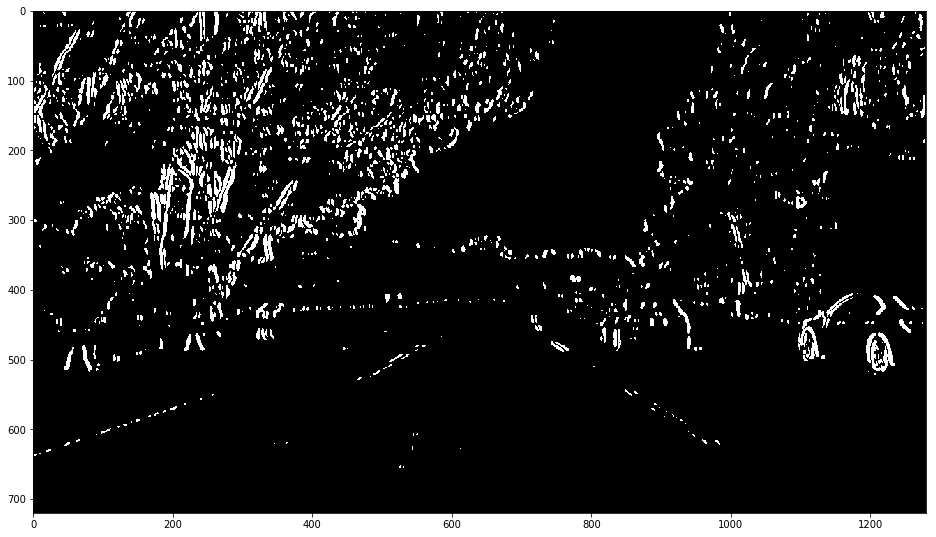

In [5]:
def gradx_select(img, thresh=(0,255), ksize=5):
    grad = np.zeros_like(img[:,:,0]).astype(np.float64)

    kernel = np.ones((ksize,ksize),np.float32)/ksize**2
    median = cv2.filter2D(img,-1,kernel)
        
    sobelx = np.absolute(cv2.Sobel(median, cv2.CV_64F, 1, 0))
    scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))
    grad = cv2.cvtColor(scaled_sobel, cv2.COLOR_RGB2GRAY)
    
    #grad = cv2.addWeighted(grad, 1, scaled_sobel, 0.33, 0)
    
    #grad = np.uint8(255*grad/np.max(grad))
    binary_output = np.zeros_like(grad)
    binary_output[(grad > thresh[0]) & (grad <= thresh[1])] = 1
    return binary_output

plt.figure(figsize=(16,16))
plt.imshow(gradx_select(img, thresh=(50, 250), ksize=5), cmap='gray')
plt.show()

## 4. Combine the images together

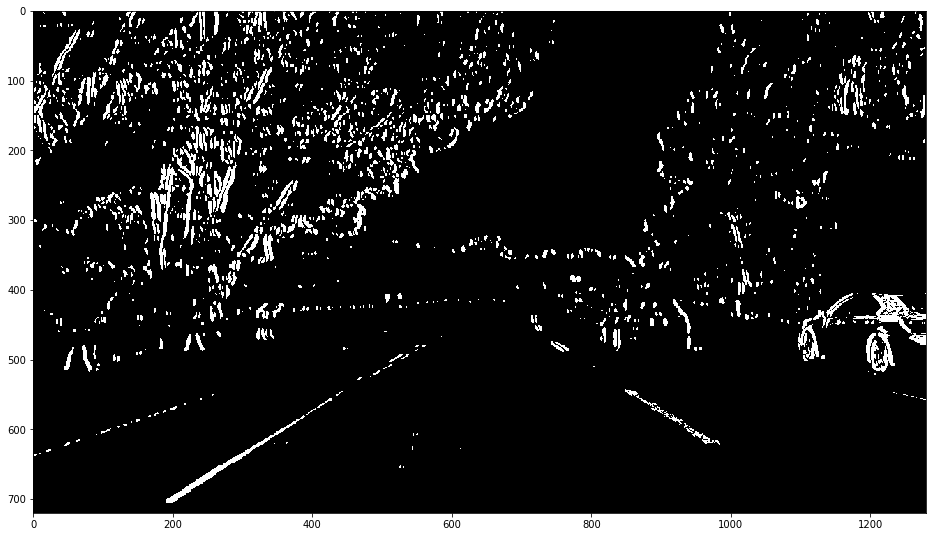

In [6]:
def binary_select(img, hls_thresh=(0,255), grad_thresh=(0,255)):
    hls = hls_select(img, thresh=hls_thresh)
    grad = gradx_select(img, thresh=grad_thresh)
    binary = np.zeros_like(grad)
    binary[(grad==1)|(hls==1)] = 1
    return binary

plt.figure(figsize=(16,16))
plt.imshow(binary_select(img, hls_thresh=(200, 255), grad_thresh=(50, 255)), cmap='gray')
plt.show()

The above image is used for lane detection in this project/pipeline.

# Warping

We now want to warp the image to proudce a top-down view of the lane inorder to detect the lanes.  For this We want to fine the vanishing point inorder to inform our perspective change.

Below is an a plot of looking for intersecting lines to identify the vanishing point for the image.

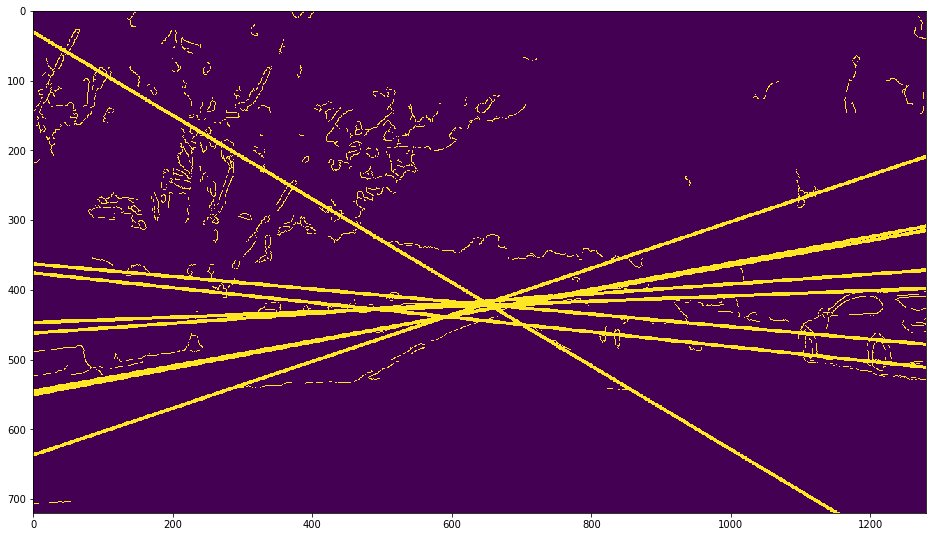

In [7]:
rho = 1
theta = np.pi/180
threshold = 1
min_line_len = 50
max_line_gap = 7
k_size = 7
kernel = np.ones((k_size,k_size),np.float32)/k_size**2

median = cv2.filter2D(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),-1,kernel)
edge = cv2.Canny(median, 30,160)
lines = cv2.HoughLinesP(edge, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)

for line in lines:
    slope = (line[0,3]-line[0,1])/(line[0,2]-line[0,0])
    intercept = (line[0,3] - slope*line[0,2])
    if slope != 0 and np.isfinite(intercept):
        cv2.line(
            edge, 
            (0, int(intercept)), 
            (img.shape[1], int(img.shape[1]*slope+intercept)), 
            (255, 0, 0), 
            3
        )
plt.figure(figsize=(16,16))
plt.imshow(edge)
plt.show()

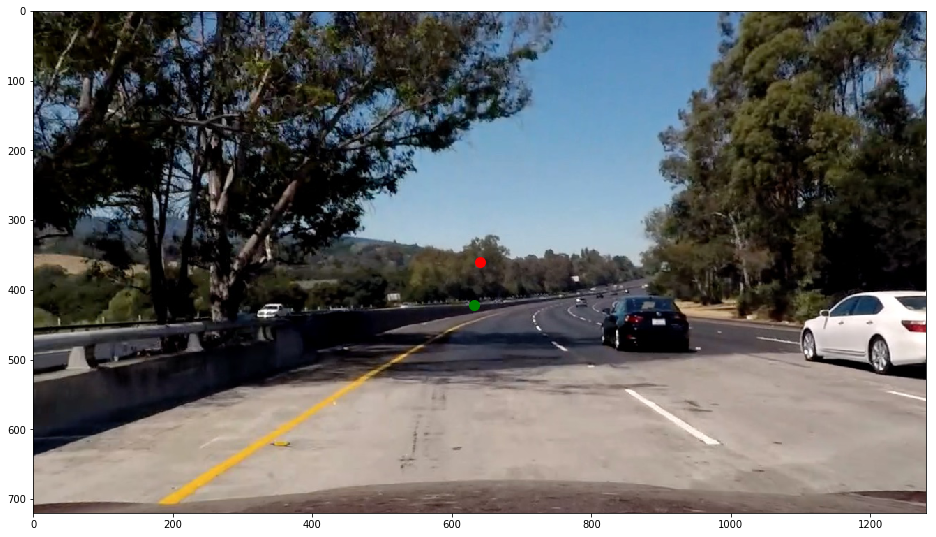

In [8]:
def get_vanishing_point(img):
    rho = 1
    theta = np.pi/180
    threshold = 1
    min_line_len = 50
    max_line_gap = 5
    k_size = 5
    kernel = np.ones((k_size,k_size),np.float32)/k_size**2

    median = cv2.filter2D(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),-1,kernel)
    edge = cv2.Canny(median, 30,160)
    lines = cv2.HoughLinesP(edge, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    
    blank = np.zeros_like(img)[:,:,0]
    x = np.arange(0,blank.shape[1]).astype(np.int)
    for line in lines:
        slope = (line[0,3]-line[0,1])/(line[0,2]-line[0,0])
        intercept = (line[0,3] - slope*line[0,2])
        if slope != 0 and np.isfinite(intercept):
            y = (slope*x+intercept).astype(np.int)
            pts = np.vstack([y,x]).T
            pts = pts[(y>=0)&(y<=blank.shape[0]-1),:]
            blank[pts[:,0],pts[:,1]] += 1

    ys = blank.sum(axis=1)
    i_ys = (ys > 0.95*ys.max()).nonzero()[0]
    xs = blank[i_ys].sum(axis=0)

    y_vanish = np.median(i_ys).astype(int)
    x_vanish = np.median((xs > 0.95*xs.max()).nonzero()[0]).astype(int)
    return (x_vanish, y_vanish)


x_vanish, y_vanish = get_vanishing_point(img)

plt.figure(figsize=(16,16))
plt.imshow(img)
plt.scatter([x_vanish],[y_vanish], s=100, c='green')
plt.scatter([img.shape[1]//2],[img.shape[0]//2], s=100, c='red')
plt.show()

Using the center of the image might not create a accurate warping.  You can see the vanishing point in green in the above plot, and the cneter of the image in red.   It is clear that lines do not vanish to the red point in this image.  

Using the vanishing point, we can create a bounding box for to warp based on the geometry from the vanishing point.  That box is shown below:

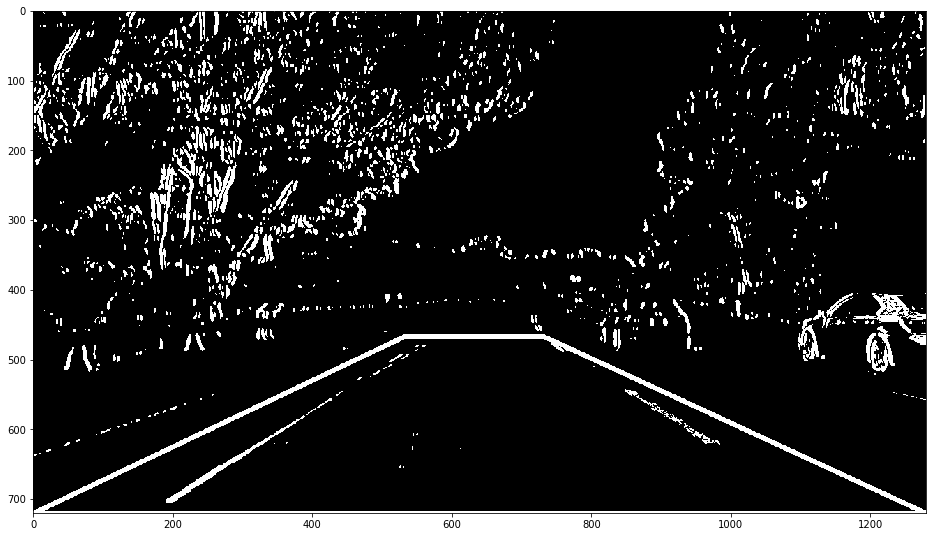

In [9]:
def get_vertices(img, vanish_point, drop=100):
    image = img.copy()
    pnt1 = (img.shape[1],image.shape[0])
    
    s1 = (vanish_point[1] - pnt1[1]) / (vanish_point[0] - pnt1[0])
    i1 = vanish_point[1] - s1 * vanish_point[0]
    pnt2 = (
        int( vanish_point[0] + drop),
        int( (vanish_point[0] + drop) * s1 + i1 )
    )
    
    pnt4 = (0,image.shape[0])
    
    pnt3 = (
        int( vanish_point[0] - drop),
        int( (vanish_point[0] + drop) * s1 + i1)
    )

    return np.array([pnt1, pnt2, pnt3, pnt4], dtype=np.int32)
    
vert = get_vertices(img, (x_vanish, y_vanish))
bin_img = binary_select(img, hls_thresh=(200, 255), grad_thresh=(50, 255))

for i, pnt in enumerate(vert):
    cv2.line(bin_img, tuple(pnt), tuple(vert[i-1]), (1, 0, 0), 5 )
                         
                         

plt.figure(figsize=(16,16))
plt.imshow(bin_img, cmap='gray')
plt.show()

Using the source points as the bounding box and the destination points as the corners of the image, we can create a perspective transform for transforming images from the standard perspective to the top-down perspective.

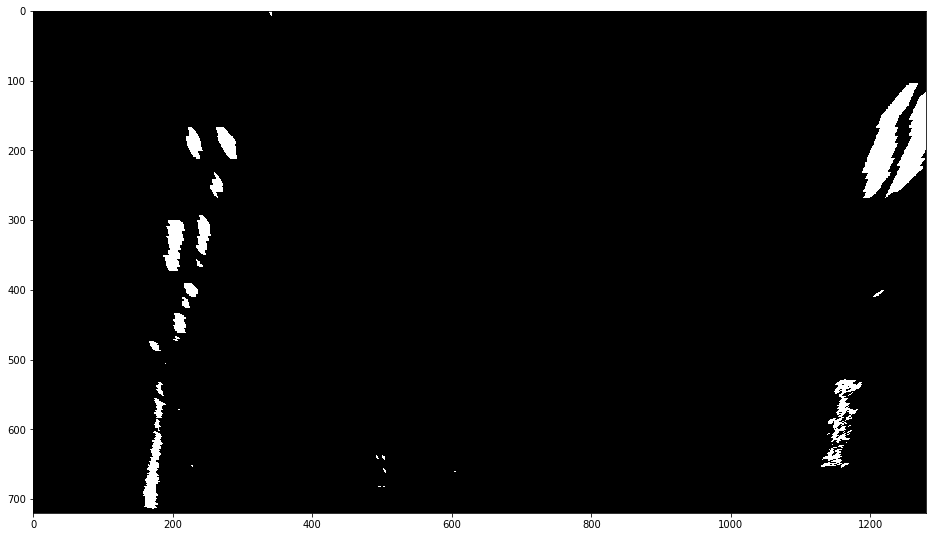

In [10]:
def get_src_dst(img, vanish_pnts, offset = 0):
    img_size = (gray.shape[1], gray.shape[0])

    src = get_vertices(img, vanish_pnts).astype(np.float32)
    dst = np.float32([
        [img_size[0]-offset, img_size[1]-offset], 
        [img_size[0]-offset, offset],
        [offset, offset],
        [offset, img_size[1]-offset]
    ])
    return src, dst

src, dst = get_src_dst(img,  (x_vanish, y_vanish))
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

warped = cv2.warpPerspective(binary_select(img, hls_thresh=(200, 255), grad_thresh=(50, 255)), M, img.shape[:2][::-1])

plt.figure(figsize=(16,16))
plt.imshow(warped, cmap='gray')
plt.show()

# Lane Detection

For this project I decided to fit the data using a constrain regression for the two polynomial lines.

$$  X = \begin{bmatrix} X_{left} & 0\\0 & X_{right}\end{bmatrix} $$  

Where a row in each matrix is represented by  $x_{left} = \begin{bmatrix} 1 \ y_p \ y^2_p \end{bmatrix}$ and $y_p$ is the y-position of non-zero pixels.

$$ Y = \begin{bmatrix} y_{left} \\ y_{right}\end{bmatrix} $$

Where a row the $Y$ matrix is is the corresponding x-position of a non-zero pixel.

The coefficients ($\beta$) for the fit can be solved using the following equation.

$$ \beta = \left( X^T \ X + \lambda \ \Lambda \right)^{-1} \ X^T \ Y$$

The $\lambda$ is term is a regularization value and $\Lambda$ is the regularization matrix that is a Gaussian prior on the fit.   In this case I am using the term to fulfill two purposes.  

1.  Regularize the second order term in the polyinomal to zero to avoid overfitting on the curvature
2.  Constrain the curvature of the two poly nomial to be similar.

To do this I am using this matrix for the regularization term.

$$ \Lambda = 
    \begin{bmatrix} 
    0 & 0 & 0 & 0 & 0 & 0 \\ 
    0 & 1 & 0 & 0 & -1 & 0 \\ 
    0 & 0 & 2 & 0 & 0 & -1 \\ 
    0 & 0 & 0 & 0 & 0 & 0 \\ 
    0 & -1 & 0 & 0 & 1 & 0 \\ 
    0 & 0 & 0 & -1 & 0 & 2 \\ 
 \end{bmatrix} $$

This term establises a prior that the first and second order terms of the polynomial should be the same (proxy for similar curvatures) and that the second order term should be zero.

## Class for Lane Detection

In [33]:
from sklearn.preprocessing import PolynomialFeatures

class LaneDetector():
    
    def __init__(self, l2 = 1e8, ym_per_pix=30/720, xm_per_pix=3.7/700, eps=0.8):
        self.polytransform = PolynomialFeatures(2, include_bias=True)
        self.coef = None
        self.L = np.zeros((6,6))
        self.L[1,1] = 1
        self.L[1,4] = -1
        self.L[2,2] = 2
        self.L[2,5] = -1
        self.L[4,1] = -1
        self.L[4,4] = 1
        self.L[5,2] = -1
        self.L[5,5] = 2
        self.L = self.L*l2
        self.ym_per_pix = ym_per_pix
        self.xm_per_pix = xm_per_pix
        self.eps = eps
        self.prev_X = None
        self.prev_Y = None
        self.r = []
        
    
    def R(self):
        return(np.mean(np.array(self.r)).astype(int))

    def gen_data(self, img):
        y, x = img.nonzero()
        y1 = y[x < img.shape[1]//2] * self.ym_per_pix
        x1 = x[x < img.shape[1]//2] * self.xm_per_pix

        y2 = y[x >= img.shape[1]//2] * self.ym_per_pix
        x2 = x[x >= img.shape[1]//2] * self.xm_per_pix
        
        try:
            y1p = self.polytransform.fit_transform(y1.reshape((y1.size,1)))
            y2p = self.polytransform.fit_transform(y2.reshape((y2.size,1)))

            Y = np.vstack([
                np.hstack([y1p, np.zeros_like(y1p)]),
                np.hstack([np.zeros_like(y2p), y2p])
            ])
            X = np.concatenate([x1, x2])
            self.prev_X = X
            self.prev_Y = Y
            return X, Y
        except:
            return self.prev_X, self.prev_Y
        
    def update(self, img):
       
        X, Y = self.gen_data(img)
        if X is not None:
            inv = np.linalg.inv(Y.T.dot(Y) + self.L)
            if self.coef is None:
                self.coef = inv.dot(Y.T.dot(X))
            else:
                self.coef = inv.dot(Y.T.dot(X)) * self.eps + (1 - self.eps)*self.coef
            self.r.append(
                0.5* np.power(1 + np.power(self.coef[1], 2), 1.5)/np.abs(self.coef[2])
            )
            self.r.append(
                0.5* np.power(1 + np.power(self.coef[4], 2), 1.5)/np.abs(self.coef[5])
            )
            
            if len(self.r) > 15:
                self.r = self.r[len(self.r)-15:]
            
            
    
    def draw(self, img_2d):
        
        
        if self.coef is None:
            return np.dstack([img_2d]*3)
        f1 = np.poly1d(self.coef[:3][::-1])
        f2 = np.poly1d(self.coef[3:][::-1])
        ys = np.linspace(0,img_2d.shape[1],2000) * self.ym_per_pix
        pts1 = np.array(
            list(zip(
                f1(ys)/self.xm_per_pix, 
                ys/self.ym_per_pix)),
            np.int32
        ).reshape((-1,1,2)) 
        pts2 = np.array(
            list(zip(
                f2(ys)/self.xm_per_pix, 
                ys/self.ym_per_pix
            )), 
            np.int32
        ).reshape((-1,1,2)) 
        
        img_copy = np.dstack([img_2d]*3)
        cv2.fillPoly(img_copy, np.hstack([pts2,pts1]), (0,255,0))
        cv2.polylines(img_copy, pts1, True,(255,0,0),25)
        cv2.polylines(img_copy, pts2, True,(255,0,0),25)
        return img_copy

## Fiting and Drawing Polynomial Fit

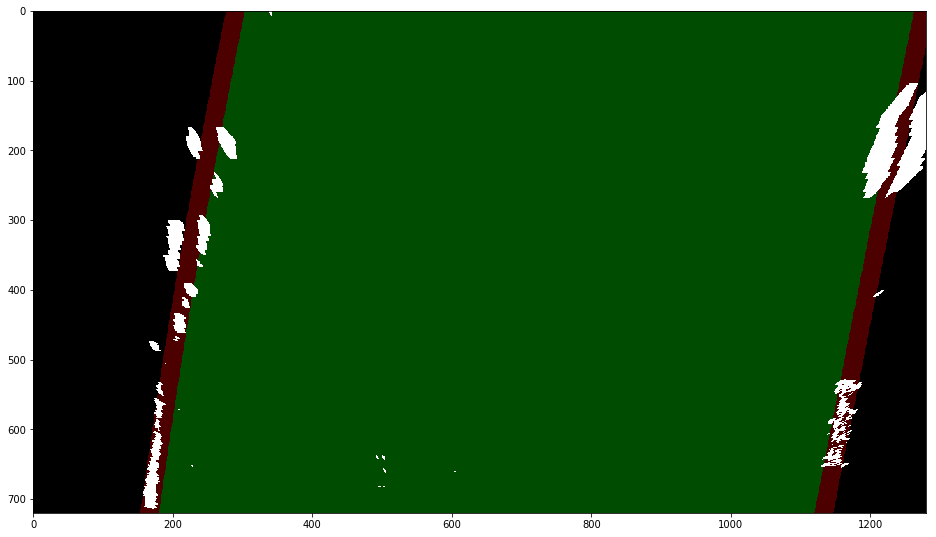

In [34]:
LD = LaneDetector()
LD.update(warped)

overlay = LD.draw(warped)
w = np.dstack([warped > 0]*3).astype(np.uint8)*255
result = cv2.addWeighted(w, 1, overlay, 0.3, 0)
plt.figure(figsize=(16,16))
plt.imshow(result)
plt.show()

From this overlay we can now reverse the perspective transform and overlay on the undistorted version of the image.

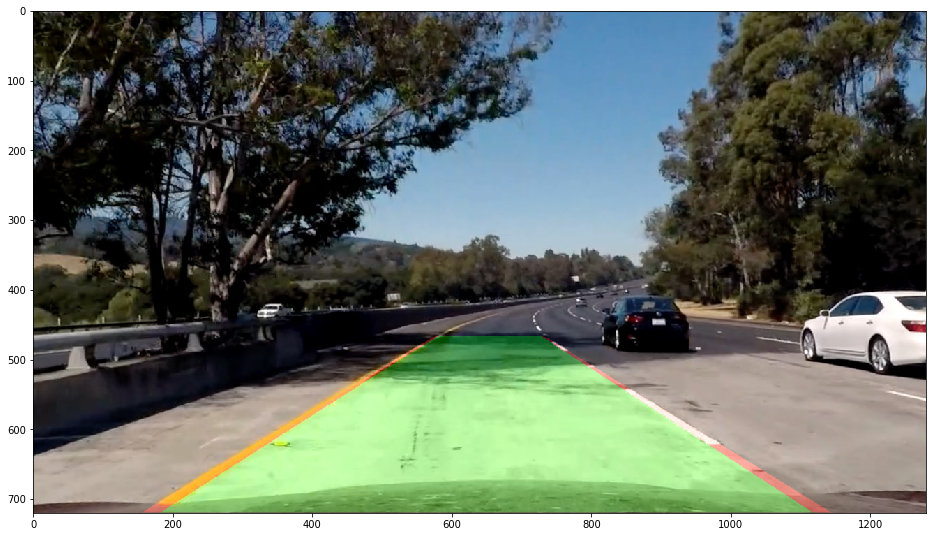

In [35]:
blank = np.zeros_like(img).astype(np.uint8)

overlay = cv2.warpPerspective(
    overlay, 
    Minv, 
    overlay.shape[:2][::-1]
)
result = cv2.addWeighted(img, 1, overlay, 0.3, 0)
plt.figure(figsize=(16,16))
plt.imshow(result)
plt.show()

# Transformation Pipeline

The primary goal of this project is to produce a pipline that can detect and overlay the detection of the lane on the video.  The process for this pipeline is to perform the following operations on each image sent through the pipeline:

1.  If pipline is not initalized
    1.  Detect Vanishing Points
    2.  Generate Perspective Matrixs
2.  Undistort the image from camera calibrations
3.  Transform image to highlight lane features
4.  Warp Transformed Image to Top-Perspecrtive
5.  Fit Lanes with Polynomial
    1.  Update Fit if Fit is valid
6.  Draw Current Fit of Lane Lines
7.  Transform back to undistorted perspective
8.  Overlay on Image

The following class is the implemntation of this pipeline.

In [42]:
class LanePipeLine():
    
    def __init__(self, mtx, dist, return_warped = False):
        self.mtx = mtx
        self.dist = dist
        self.initalized = False
        self.midpoint = None
        self.M = None
        self.Minv = None
        self.vanishing_pnt = None
        self.lane_detector = LaneDetector(l2 = 1e6, eps=0.1)
        self.return_warped = return_warped
        
    def transform(self, img):
        
        undist = self.undistort_image(img)
        binary = self.binary_select(
            undist, 
            hls_thresh=(125, 255), 
            grad_thresh=(75, 255)
        )
    
        if not self.initalized:
            self.vanishing_pnt = self.get_vanishing_point(img)
            src, dst = self.get_src_dst(img, self.vanishing_pnt)
            self.M = cv2.getPerspectiveTransform(src, dst)
            self.Minv = cv2.getPerspectiveTransform(dst, src)
            self.initalized = True
        
        warped = cv2.warpPerspective(
            binary, 
            self.M, 
            img.shape[:2][::-1]
        )
        
        
        #return (np.dstack([warped, warped, warped]) > 0).astype(np.uint8)*255
        
        self.lane_detector.update(warped)
        overlay = self.lane_detector.draw(warped)
        
        if self.return_warped:
            return cv2.addWeighted((np.dstack([warped, warped, warped]) > 0).astype(np.uint8)*255, 1, overlay, 0.3, 0)
        
        overlay = cv2.warpPerspective(
            overlay, 
            self.Minv, 
            overlay.shape[:2][::-1]
        )
        
        
        result = cv2.addWeighted(undist, 1, overlay, 0.3, 0)
        font = cv2.FONT_HERSHEY_SIMPLEX
        result = cv2.putText(result,'R = {}m'.format(self.lane_detector.R()),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
        return result
                                     
    def undistort_image(self, img):
        return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
    
    def gradx_select(self, img, thresh=(0,255), ksize=5):
        grad = np.zeros_like(img[:,:,0]).astype(np.float64)

        kernel = np.ones((ksize,ksize),np.float32)/ksize**2
        median = cv2.filter2D(img,-1,kernel)

        sobelx = np.absolute(cv2.Sobel(median, cv2.CV_64F, 1, 0))
        scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))
        grad = cv2.cvtColor(scaled_sobel, cv2.COLOR_RGB2GRAY)

        #grad = cv2.addWeighted(grad, 1, scaled_sobel, 0.33, 0)

        #grad = np.uint8(255*grad/np.max(grad))
        binary_output = np.zeros_like(grad)
        binary_output[(grad > thresh[0]) & (grad <= thresh[1])] = 1
        return binary_output

    def hls_select(self, img, thresh=(0, 255)):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        h_channel = hls[:,:,0]
        l_channel = hls[:,:,1]
        mask = (s_channel > thresh[0]) & (s_channel <= thresh[1]) 
        mask = mask & (
            ((h_channel > 15) & (h_channel < 25) & (l_channel > 75)) |
            (l_channel > 150)
        )
        binary_output = np.zeros_like(s_channel)
        binary_output[mask] = 1
        return binary_output
    
    def binary_select(self, image, hls_thresh=(0,255), grad_thresh=(0,255)):
        hls = self.hls_select(image, thresh=hls_thresh)
        grad = self.gradx_select(image, thresh=grad_thresh)
        binary = np.zeros_like(grad)
        binary[(grad==1)|(hls==1)] = 1
        return binary

    
    def get_vertices(self, img, vanish_point, drop=100):
        pnt1 = (img.shape[1],image.shape[0])

        s1 = (vanish_point[1] - pnt1[1]) / (vanish_point[0] - pnt1[0])
        i1 = vanish_point[1] - s1 * vanish_point[0]
        pnt2 = (
            int( vanish_point[0] + drop),
            int( (vanish_point[0] + drop) * s1 + i1 )
        )

        pnt4 = (0,image.shape[0])

        pnt3 = (
            int( vanish_point[0] - drop),
            int( (vanish_point[0] + drop) * s1 + i1)
        )

        return np.array([pnt1, pnt2, pnt3, pnt4], dtype=np.int32)
    

    def get_src_dst(self, img, vanish_pnts, offset = 0):
        img_size = (img.shape[1], img.shape[0])

        src = get_vertices(img, vanish_pnts).astype(np.float32)
        dst = np.float32([
            [img_size[0]-offset, img_size[1]-offset], 
            [img_size[0]-offset, offset],
            [offset, offset],
            [offset, img_size[1]-offset]
        ])
        return src, dst
    
    def get_vanishing_point(self, img):
        rho = 1
        theta = np.pi/180
        threshold = 1
        min_line_len = 50
        max_line_gap = 6
        k_size = 5
        kernel = np.ones((k_size,k_size),np.float32)/k_size**2

        median = cv2.filter2D(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),-1,kernel)
        edge = cv2.Canny(median, 30,160)
        lines = cv2.HoughLinesP(edge, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)

        blank = np.zeros_like(img)[:,:,0]
        x = np.arange(0,blank.shape[1]).astype(np.int)
        for line in lines:
            slope = (line[0,3]-line[0,1])/(line[0,2]-line[0,0])
            intercept = (line[0,3] - slope*line[0,2])
            if slope != 0 and np.isfinite(intercept):
                y = (slope*x+intercept).astype(np.int)
                pts = np.vstack([y,x]).T
                pts = pts[(y>=0)&(y<=blank.shape[0]-1),:]
                blank[pts[:,0],pts[:,1]] += 1
        
        ys = blank.sum(axis=1)
        i_ys = (ys > 0.95*ys.max()).nonzero()[0]
        xs = blank[ys > 0.95*ys.max()].sum(axis=0)

        y_vanish = np.median(i_ys).astype(int)
        i_xs = (xs > 0.95*xs.max()).nonzero()[0]
        x_vanish = np.median(i_xs).astype(int)
        return (img.shape[1]//2, y_vanish-30)

## Desting Pipeline on single Test Image

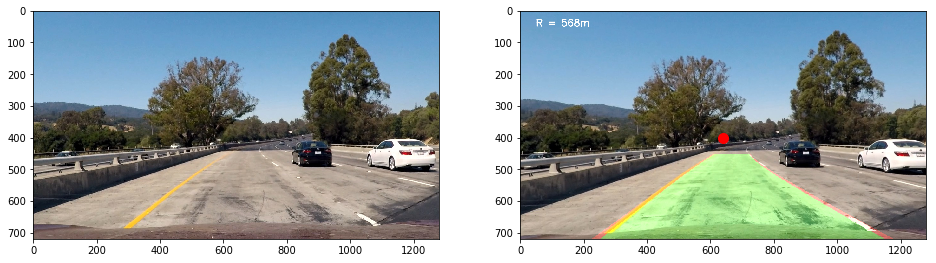

In [37]:
raw = cv2.cvtColor(cv2.imread('test_images/test1.jpg'), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,16))
ax = plt.subplot(1,2,1)
plt.imshow(raw)
ax = plt.subplot(1,2,2)
pipeline = LanePipeLine(mtx, dist)
plt.imshow(pipeline.transform(raw))
plt.scatter(pipeline.vanishing_pnt[0], pipeline.vanishing_pnt[1], color='red', s=100)
plt.show()

## Testing Pipeline on all Test Images

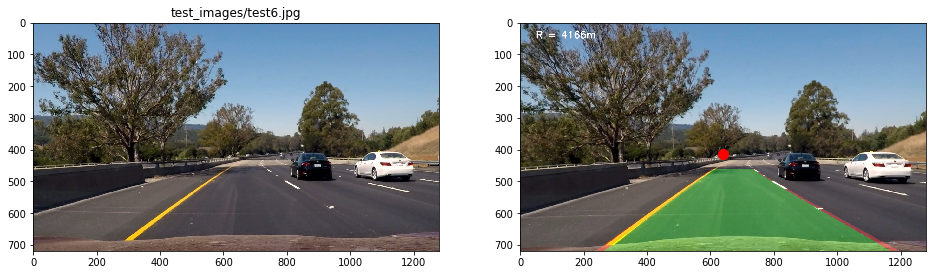

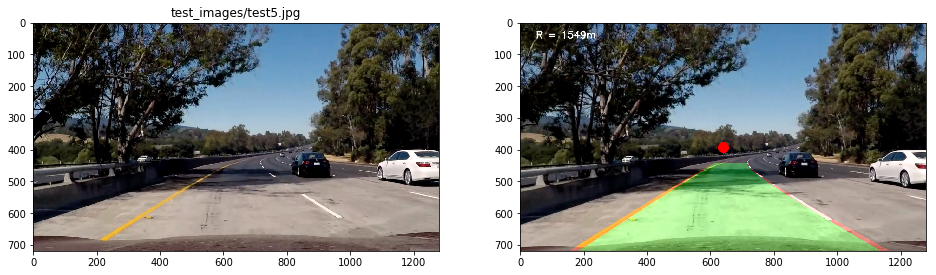

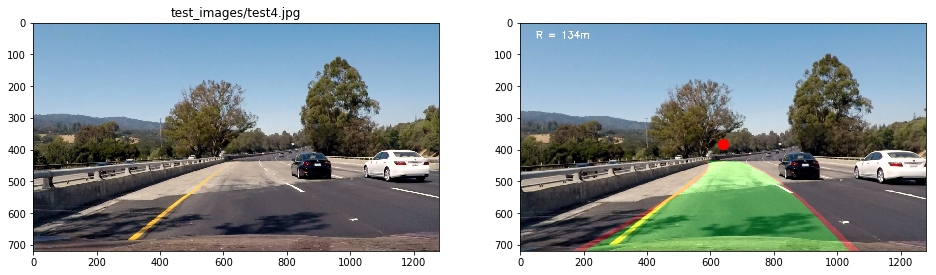

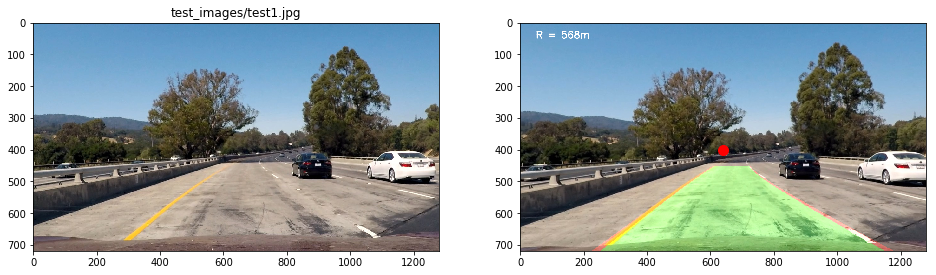

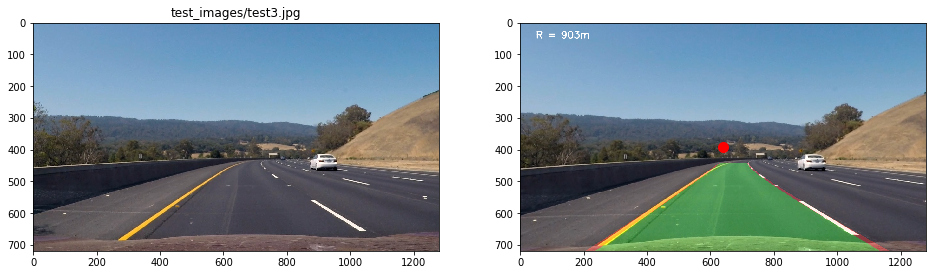

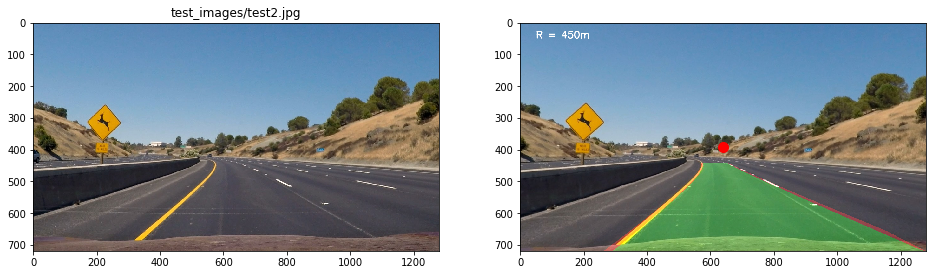

In [38]:
for test_img in glob('test_images/test*.jpg'):
    raw = cv2.cvtColor(cv2.imread(test_img), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(16,16))
    
    ax = plt.subplot(1,2,1)
    plt.imshow(raw)
    plt.title(test_img)
    ax = plt.subplot(1,2,2)
    
    pipeline = LanePipeLine(mtx, dist)
    plt.imshow(pipeline.transform(raw))
    plt.scatter(pipeline.vanishing_pnt[0], pipeline.vanishing_pnt[1], color='red', s=100)
    plt.show()

The process does a good job on fiting the lane.  There is a litter difformation on test4.jpg.   This is not seen in the video because of the smoothing.

# Transform Movie of Driving

In [39]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pipeline = LanePipeLine(mtx, dist)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'project_video_transformed.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video project_video_transformed.mp4
[MoviePy] Writing video project_video_transformed.mp4


100%|█████████▉| 1260/1261 [03:00<00:00,  6.21it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_transformed.mp4 

CPU times: user 11min 55s, sys: 49.6 s, total: 12min 45s
Wall time: 3min


The video is in the this github report titled 'project_video_transformed.mp4'.  This I have also included a video of just the warpped video with the overlay in 'project_video_warp_transformed'

In [43]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pipeline = LanePipeLine(mtx, dist, return_warped=True)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'project_video_warp_transformed.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video project_video_warp_transformed.mp4
[MoviePy] Writing video project_video_warp_transformed.mp4


100%|█████████▉| 1260/1261 [02:59<00:00,  6.99it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_warp_transformed.mp4 

CPU times: user 11min 37s, sys: 49.1 s, total: 12min 26s
Wall time: 2min 59s


# Improvements 

The video pipeline does well on the main video, but doe snot do well on the challenge videos.  In the challenge video, the binary_selector functio provided give a number of feature because of all the shadows, texture changes, and tire marks on the road.   Windowing would liklely help with my constrain regression, but I did not implement it for this project.

In the even harder video, the vanish point detection does a horrible job at finding the center of the image.  All of the warped images are very poor for fitting as a result.   

